# Face Generation
GAN is used to generate new images of faces using CelebA dataset

In [1]:
import helper
import os
from glob import glob
from matplotlib import pyplot
import tensorflow as tf

data_dir = './input'
helper.download_extract('celeba', data_dir)

Found celeba Data


## CelebA Dataset


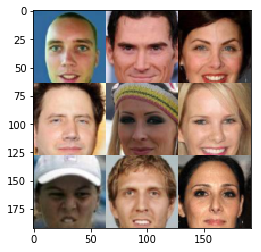

In [2]:
show_n_images = 9

celebA_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 64, 64, 'RGB')
pyplot.imshow(helper.images_square_grid(celebA_images, 'RGB'))

## Preprocess the Data and Build the Network
- The values of CelebA dataset will be in the range of -0.5 to 0.5 of 64x64 dimensional images.  
- The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 64x64.

### Input
This function creates these placeholders:
- Real input images placeholder = (None, image_width, image_height, image_channels) rank = 4.
- Z input placeholder = (None, z_dim) = rank 2.
- Learning rate placeholder = rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [3]:
def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    

    return inputs_real, inputs_z, learning_rate


### Discriminator
- tf.variable_scope allows to reuse the variabes in the neural network.

#### Batch Normalization
- B.N. is an effective way to improve neural network performance.
- Ioffe and Szegedy show that batch normalization enables the use of higher learning rates, acts as a regularizer and can speed up training by 14 times.

In [4]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        
        alpha = 0.2
        
        # Input layer is 64x64x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        
        # 32x32x64 now
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        
        # 16x16x128 now
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        # 8x8x256 now

        # Flatten it
        flat = tf.reshape(relu3, (-1, 8*8*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


### Generator
- Generator generates an image from random noise z. 
- The function must be able to reuse the variabes in the NN with help of tf.variable_scope function.
- The function returns 64x64x3 image.

In [5]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        
        alpha = 0.2
        
        # First fully connected layer
        x1 = tf.layers.dense(z, 8*8*256)
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 8, 8, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        # 8x8x256 now
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        # 16x16x128 now
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        # 32x32x64 now
        
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 64x64x3 now
        
        out = tf.tanh(logits)
        
        return out



### Loss
- D real loss wants all the real inputs are real  (d_logits_real; +1)
- D fake loss wants all the fake inputs are fake  (d_logits_fake; 0)
- G loss wants all the generated inputs are real  (d_logits_fake; +1)
- D total loss == D real loss + D fake loss
- G total loss == G loss
- return D total loss and G total loss

In [6]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: (discriminator loss, generator loss)
    """
    smooth = 0.1
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss



### Optimization
- tf.trainable_variables is used to get all the trainable variables.  
- filter the variables with names that are in the 'discriminator' and 'generator' scope names.  
- returns (discriminator training operation, generator training operation).

In [7]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)): 
        
        d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

        return d_train_opt, g_train_opt


### Show Generated Images
- Display generated images in form of sqrt(n_images) x sqrt(n_images) = 4 x 4

In [8]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
- Build and train GAN.
- Use model_inputs, model_loss, and model_opt functions.
- model_inputs(image_width, image_height, image_channels, z_dim)
- model_loss(input_real, input_z, out_channel_dim)
- model_opt(d_loss, g_loss, learning_rate, beta1)
- generator outputs will be printed in form of 4x4 matrix every 100 batches.

In [9]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # Need to first map the input_real dims to data_shape
    image_width = data_shape[1]
    image_height = data_shape[2]
    image_channels = data_shape[3]
    
    ### Build GAN
    
    # Define Model_Inputs
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    
    # Define Model_Loss
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    
    # Define Model_Opt
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    ### Training
    n_total_batches = data_shape[0] // batch_size
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epoch_count):
            batch_counter = 0
            
            for batch_images in get_batches(batch_size):
                batch_counter += 1
                
                # Scaled real image values from [-0.5, 0.5] into [-1, 1]
                batch_images = batch_images*2.0
                
                # Sample random noise for generator
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, 
                                                     input_z: batch_z,
                                                     lr: learning_rate})
                
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, 
                                                     input_z: batch_z,
                                                     lr: learning_rate})
                
                # For each 10 batches, get the losses and print them out
                
                if batch_counter % 10 == 0:
                    d_train_loss = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    
                    g_train_loss = g_loss.eval({input_z: batch_z})
                    
                    print("Epoch {}/{} - Batch {}/{}: ".format(e+1, epoch_count, batch_counter, n_total_batches),
                          "Discriminator loss = {:.4f} ".format(d_train_loss),
                          "Generator loss = {:.4f}".format(g_train_loss))
                    
                # Show generator output samples so we can see the progress during training
                
                if batch_counter % 100 == 0:
                    show_generator_output(sess, n_images, input_z, image_channels, data_image_mode)
                

### CelebA
- GPU NVIDIA K5200 is used for training. 

Epoch 1/1 - Batch 10/6331:  Discriminator loss = 1.7213  Generator loss = 0.4386
Epoch 1/1 - Batch 20/6331:  Discriminator loss = 0.9071  Generator loss = 1.1744
Epoch 1/1 - Batch 30/6331:  Discriminator loss = 0.5205  Generator loss = 3.0617
Epoch 1/1 - Batch 40/6331:  Discriminator loss = 0.4920  Generator loss = 4.2229
Epoch 1/1 - Batch 50/6331:  Discriminator loss = 2.6154  Generator loss = 0.1998
Epoch 1/1 - Batch 60/6331:  Discriminator loss = 0.9244  Generator loss = 3.8984
Epoch 1/1 - Batch 70/6331:  Discriminator loss = 1.3190  Generator loss = 1.2343
Epoch 1/1 - Batch 80/6331:  Discriminator loss = 1.2639  Generator loss = 0.7395
Epoch 1/1 - Batch 90/6331:  Discriminator loss = 0.7450  Generator loss = 2.1816
Epoch 1/1 - Batch 100/6331:  Discriminator loss = 1.1511  Generator loss = 0.9116


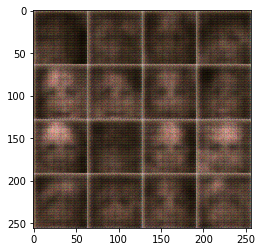

Epoch 1/1 - Batch 110/6331:  Discriminator loss = 0.7887  Generator loss = 1.3590
Epoch 1/1 - Batch 120/6331:  Discriminator loss = 1.1630  Generator loss = 0.8291
Epoch 1/1 - Batch 130/6331:  Discriminator loss = 0.5984  Generator loss = 2.0562
Epoch 1/1 - Batch 140/6331:  Discriminator loss = 0.7997  Generator loss = 1.2733
Epoch 1/1 - Batch 150/6331:  Discriminator loss = 0.7057  Generator loss = 1.7763
Epoch 1/1 - Batch 160/6331:  Discriminator loss = 0.7881  Generator loss = 1.2403
Epoch 1/1 - Batch 170/6331:  Discriminator loss = 0.6146  Generator loss = 1.9361
Epoch 1/1 - Batch 180/6331:  Discriminator loss = 1.0586  Generator loss = 0.9181
Epoch 1/1 - Batch 190/6331:  Discriminator loss = 0.7227  Generator loss = 1.6708
Epoch 1/1 - Batch 200/6331:  Discriminator loss = 0.7747  Generator loss = 1.3455


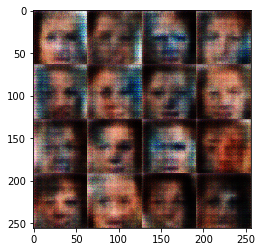

Epoch 1/1 - Batch 210/6331:  Discriminator loss = 0.6975  Generator loss = 1.7707
Epoch 1/1 - Batch 220/6331:  Discriminator loss = 0.9499  Generator loss = 1.2004
Epoch 1/1 - Batch 230/6331:  Discriminator loss = 0.8788  Generator loss = 1.1684
Epoch 1/1 - Batch 240/6331:  Discriminator loss = 1.8252  Generator loss = 6.1344
Epoch 1/1 - Batch 250/6331:  Discriminator loss = 1.4035  Generator loss = 3.4735
Epoch 1/1 - Batch 260/6331:  Discriminator loss = 1.1587  Generator loss = 0.7524
Epoch 1/1 - Batch 270/6331:  Discriminator loss = 0.7050  Generator loss = 2.2641
Epoch 1/1 - Batch 280/6331:  Discriminator loss = 0.5955  Generator loss = 1.9965
Epoch 1/1 - Batch 290/6331:  Discriminator loss = 0.8736  Generator loss = 1.5164
Epoch 1/1 - Batch 300/6331:  Discriminator loss = 0.6900  Generator loss = 1.8481


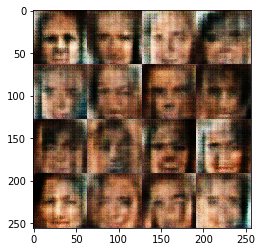

Epoch 1/1 - Batch 310/6331:  Discriminator loss = 1.1020  Generator loss = 0.8711
Epoch 1/1 - Batch 320/6331:  Discriminator loss = 0.6295  Generator loss = 1.7884
Epoch 1/1 - Batch 330/6331:  Discriminator loss = 0.8108  Generator loss = 2.4586
Epoch 1/1 - Batch 340/6331:  Discriminator loss = 3.0724  Generator loss = 6.3112
Epoch 1/1 - Batch 350/6331:  Discriminator loss = 1.9609  Generator loss = 5.9870
Epoch 1/1 - Batch 360/6331:  Discriminator loss = 1.0572  Generator loss = 0.9802
Epoch 1/1 - Batch 370/6331:  Discriminator loss = 0.7248  Generator loss = 1.6008
Epoch 1/1 - Batch 380/6331:  Discriminator loss = 0.8073  Generator loss = 2.6035
Epoch 1/1 - Batch 390/6331:  Discriminator loss = 0.9633  Generator loss = 0.9659
Epoch 1/1 - Batch 400/6331:  Discriminator loss = 0.9346  Generator loss = 2.3979


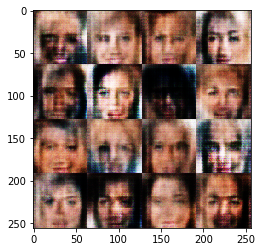

Epoch 1/1 - Batch 410/6331:  Discriminator loss = 0.6833  Generator loss = 2.0581
Epoch 1/1 - Batch 420/6331:  Discriminator loss = 0.8982  Generator loss = 1.2338
Epoch 1/1 - Batch 430/6331:  Discriminator loss = 0.6671  Generator loss = 2.1906
Epoch 1/1 - Batch 440/6331:  Discriminator loss = 1.2202  Generator loss = 0.6629
Epoch 1/1 - Batch 450/6331:  Discriminator loss = 0.8503  Generator loss = 1.9735
Epoch 1/1 - Batch 460/6331:  Discriminator loss = 0.9952  Generator loss = 1.0287
Epoch 1/1 - Batch 470/6331:  Discriminator loss = 0.7371  Generator loss = 1.8737
Epoch 1/1 - Batch 480/6331:  Discriminator loss = 0.9820  Generator loss = 0.9440
Epoch 1/1 - Batch 490/6331:  Discriminator loss = 0.7445  Generator loss = 1.8547
Epoch 1/1 - Batch 500/6331:  Discriminator loss = 0.7255  Generator loss = 2.1292


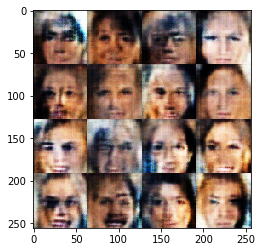

Epoch 1/1 - Batch 510/6331:  Discriminator loss = 1.2076  Generator loss = 0.6253
Epoch 1/1 - Batch 520/6331:  Discriminator loss = 0.8449  Generator loss = 1.1479
Epoch 1/1 - Batch 530/6331:  Discriminator loss = 1.0437  Generator loss = 0.8904
Epoch 1/1 - Batch 540/6331:  Discriminator loss = 0.9236  Generator loss = 1.4451
Epoch 1/1 - Batch 550/6331:  Discriminator loss = 1.0308  Generator loss = 0.9941
Epoch 1/1 - Batch 560/6331:  Discriminator loss = 0.7356  Generator loss = 1.9655
Epoch 1/1 - Batch 570/6331:  Discriminator loss = 1.6992  Generator loss = 0.4036
Epoch 1/1 - Batch 580/6331:  Discriminator loss = 1.2177  Generator loss = 0.6780
Epoch 1/1 - Batch 590/6331:  Discriminator loss = 0.9352  Generator loss = 1.1838
Epoch 1/1 - Batch 600/6331:  Discriminator loss = 0.8103  Generator loss = 1.5529


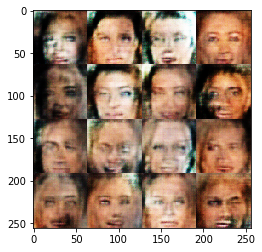

Epoch 1/1 - Batch 610/6331:  Discriminator loss = 0.9181  Generator loss = 1.3653
Epoch 1/1 - Batch 620/6331:  Discriminator loss = 0.7890  Generator loss = 1.3918
Epoch 1/1 - Batch 630/6331:  Discriminator loss = 0.8914  Generator loss = 1.2620
Epoch 1/1 - Batch 640/6331:  Discriminator loss = 0.7175  Generator loss = 2.6771
Epoch 1/1 - Batch 650/6331:  Discriminator loss = 0.8763  Generator loss = 2.3675
Epoch 1/1 - Batch 660/6331:  Discriminator loss = 0.8763  Generator loss = 1.5086
Epoch 1/1 - Batch 670/6331:  Discriminator loss = 0.9582  Generator loss = 1.0122
Epoch 1/1 - Batch 680/6331:  Discriminator loss = 0.9580  Generator loss = 2.4754
Epoch 1/1 - Batch 690/6331:  Discriminator loss = 1.0440  Generator loss = 0.8779
Epoch 1/1 - Batch 700/6331:  Discriminator loss = 0.7154  Generator loss = 2.1540


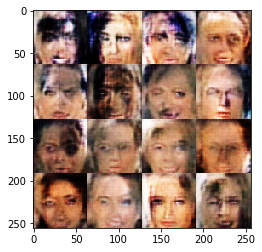

Epoch 1/1 - Batch 710/6331:  Discriminator loss = 1.3253  Generator loss = 0.6152
Epoch 1/1 - Batch 720/6331:  Discriminator loss = 0.8435  Generator loss = 1.6824
Epoch 1/1 - Batch 730/6331:  Discriminator loss = 1.2535  Generator loss = 0.6092
Epoch 1/1 - Batch 740/6331:  Discriminator loss = 1.2186  Generator loss = 0.6382
Epoch 1/1 - Batch 750/6331:  Discriminator loss = 1.3164  Generator loss = 0.5911
Epoch 1/1 - Batch 760/6331:  Discriminator loss = 0.8420  Generator loss = 1.1756
Epoch 1/1 - Batch 770/6331:  Discriminator loss = 0.8164  Generator loss = 1.8903
Epoch 1/1 - Batch 780/6331:  Discriminator loss = 1.1591  Generator loss = 2.3975
Epoch 1/1 - Batch 790/6331:  Discriminator loss = 0.8244  Generator loss = 1.5082
Epoch 1/1 - Batch 800/6331:  Discriminator loss = 1.0333  Generator loss = 1.2210


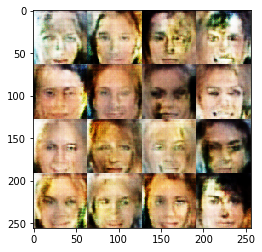

Epoch 1/1 - Batch 810/6331:  Discriminator loss = 1.2318  Generator loss = 0.6575
Epoch 1/1 - Batch 820/6331:  Discriminator loss = 0.8155  Generator loss = 1.5467
Epoch 1/1 - Batch 830/6331:  Discriminator loss = 1.2267  Generator loss = 0.6942
Epoch 1/1 - Batch 840/6331:  Discriminator loss = 0.8035  Generator loss = 1.8848
Epoch 1/1 - Batch 850/6331:  Discriminator loss = 1.0639  Generator loss = 0.8102
Epoch 1/1 - Batch 860/6331:  Discriminator loss = 0.8486  Generator loss = 1.5668
Epoch 1/1 - Batch 870/6331:  Discriminator loss = 0.8769  Generator loss = 1.2339
Epoch 1/1 - Batch 880/6331:  Discriminator loss = 1.7357  Generator loss = 0.3961
Epoch 1/1 - Batch 890/6331:  Discriminator loss = 0.9872  Generator loss = 1.0550
Epoch 1/1 - Batch 900/6331:  Discriminator loss = 1.1025  Generator loss = 0.8697


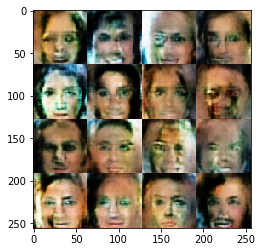

Epoch 1/1 - Batch 910/6331:  Discriminator loss = 0.9752  Generator loss = 1.5640
Epoch 1/1 - Batch 920/6331:  Discriminator loss = 1.3246  Generator loss = 0.5825
Epoch 1/1 - Batch 930/6331:  Discriminator loss = 0.6840  Generator loss = 1.5285
Epoch 1/1 - Batch 940/6331:  Discriminator loss = 0.8610  Generator loss = 1.4187
Epoch 1/1 - Batch 950/6331:  Discriminator loss = 0.9897  Generator loss = 0.9145
Epoch 1/1 - Batch 960/6331:  Discriminator loss = 0.9554  Generator loss = 2.3029
Epoch 1/1 - Batch 970/6331:  Discriminator loss = 0.9235  Generator loss = 1.3109
Epoch 1/1 - Batch 980/6331:  Discriminator loss = 1.1839  Generator loss = 0.6963
Epoch 1/1 - Batch 990/6331:  Discriminator loss = 0.8065  Generator loss = 2.4503
Epoch 1/1 - Batch 1000/6331:  Discriminator loss = 0.7963  Generator loss = 1.3897


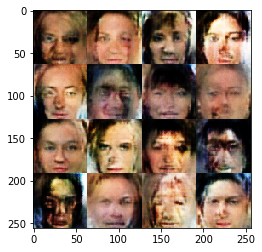

Epoch 1/1 - Batch 1010/6331:  Discriminator loss = 0.8628  Generator loss = 1.6941
Epoch 1/1 - Batch 1020/6331:  Discriminator loss = 1.1326  Generator loss = 0.8519
Epoch 1/1 - Batch 1030/6331:  Discriminator loss = 0.8351  Generator loss = 1.4936
Epoch 1/1 - Batch 1040/6331:  Discriminator loss = 1.0156  Generator loss = 1.0576
Epoch 1/1 - Batch 1050/6331:  Discriminator loss = 1.1096  Generator loss = 0.7063
Epoch 1/1 - Batch 1060/6331:  Discriminator loss = 1.1449  Generator loss = 0.6573
Epoch 1/1 - Batch 1070/6331:  Discriminator loss = 1.0088  Generator loss = 1.0162
Epoch 1/1 - Batch 1080/6331:  Discriminator loss = 0.8434  Generator loss = 2.1409
Epoch 1/1 - Batch 1090/6331:  Discriminator loss = 0.9823  Generator loss = 1.1534
Epoch 1/1 - Batch 1100/6331:  Discriminator loss = 1.3906  Generator loss = 0.4916


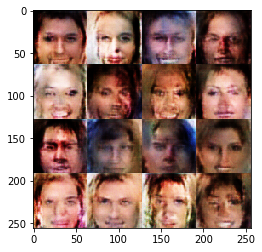

Epoch 1/1 - Batch 1110/6331:  Discriminator loss = 0.7943  Generator loss = 1.7845
Epoch 1/1 - Batch 1120/6331:  Discriminator loss = 0.7729  Generator loss = 1.5319
Epoch 1/1 - Batch 1130/6331:  Discriminator loss = 1.8358  Generator loss = 0.3558
Epoch 1/1 - Batch 1140/6331:  Discriminator loss = 1.1253  Generator loss = 0.9336
Epoch 1/1 - Batch 1150/6331:  Discriminator loss = 0.7444  Generator loss = 2.0394
Epoch 1/1 - Batch 1160/6331:  Discriminator loss = 0.8490  Generator loss = 1.1362
Epoch 1/1 - Batch 1170/6331:  Discriminator loss = 0.9294  Generator loss = 2.1094
Epoch 1/1 - Batch 1180/6331:  Discriminator loss = 1.2199  Generator loss = 0.6537
Epoch 1/1 - Batch 1190/6331:  Discriminator loss = 0.8883  Generator loss = 1.1895
Epoch 1/1 - Batch 1200/6331:  Discriminator loss = 0.9350  Generator loss = 1.7203


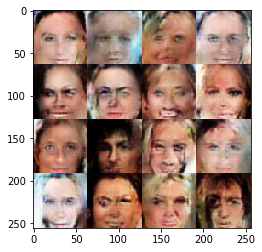

Epoch 1/1 - Batch 1210/6331:  Discriminator loss = 1.2064  Generator loss = 0.7356
Epoch 1/1 - Batch 1220/6331:  Discriminator loss = 1.0867  Generator loss = 1.7516
Epoch 1/1 - Batch 1230/6331:  Discriminator loss = 0.8619  Generator loss = 1.2998
Epoch 1/1 - Batch 1240/6331:  Discriminator loss = 0.8393  Generator loss = 1.3474
Epoch 1/1 - Batch 1250/6331:  Discriminator loss = 0.8795  Generator loss = 1.0414
Epoch 1/1 - Batch 1260/6331:  Discriminator loss = 1.0874  Generator loss = 0.8069
Epoch 1/1 - Batch 1270/6331:  Discriminator loss = 0.8957  Generator loss = 1.1856
Epoch 1/1 - Batch 1280/6331:  Discriminator loss = 1.2444  Generator loss = 0.6348
Epoch 1/1 - Batch 1290/6331:  Discriminator loss = 0.6787  Generator loss = 1.8667
Epoch 1/1 - Batch 1300/6331:  Discriminator loss = 0.9698  Generator loss = 0.9413


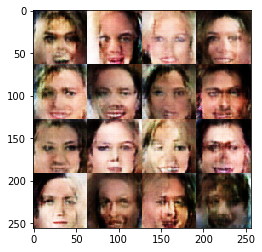

Epoch 1/1 - Batch 1310/6331:  Discriminator loss = 1.4226  Generator loss = 0.5664
Epoch 1/1 - Batch 1320/6331:  Discriminator loss = 0.9126  Generator loss = 1.4080
Epoch 1/1 - Batch 1330/6331:  Discriminator loss = 1.6131  Generator loss = 3.7821
Epoch 1/1 - Batch 1340/6331:  Discriminator loss = 0.9807  Generator loss = 0.9990
Epoch 1/1 - Batch 1350/6331:  Discriminator loss = 1.1508  Generator loss = 0.7822
Epoch 1/1 - Batch 1360/6331:  Discriminator loss = 1.0940  Generator loss = 0.7738
Epoch 1/1 - Batch 1370/6331:  Discriminator loss = 0.9397  Generator loss = 2.0153
Epoch 1/1 - Batch 1380/6331:  Discriminator loss = 0.9162  Generator loss = 1.0384
Epoch 1/1 - Batch 1390/6331:  Discriminator loss = 0.9494  Generator loss = 0.9542
Epoch 1/1 - Batch 1400/6331:  Discriminator loss = 0.9617  Generator loss = 0.9701


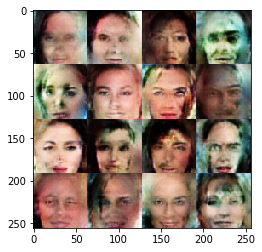

Epoch 1/1 - Batch 1410/6331:  Discriminator loss = 0.8698  Generator loss = 1.8239
Epoch 1/1 - Batch 1420/6331:  Discriminator loss = 1.2679  Generator loss = 0.6320
Epoch 1/1 - Batch 1430/6331:  Discriminator loss = 1.6361  Generator loss = 0.4255
Epoch 1/1 - Batch 1440/6331:  Discriminator loss = 1.1793  Generator loss = 0.6846
Epoch 1/1 - Batch 1450/6331:  Discriminator loss = 0.7710  Generator loss = 1.4778
Epoch 1/1 - Batch 1460/6331:  Discriminator loss = 0.9833  Generator loss = 2.5393
Epoch 1/1 - Batch 1470/6331:  Discriminator loss = 0.8402  Generator loss = 1.5189
Epoch 1/1 - Batch 1480/6331:  Discriminator loss = 0.9531  Generator loss = 1.1124
Epoch 1/1 - Batch 1490/6331:  Discriminator loss = 1.5962  Generator loss = 2.5621
Epoch 1/1 - Batch 1500/6331:  Discriminator loss = 0.9270  Generator loss = 2.3062


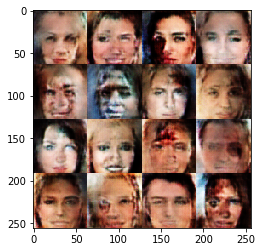

Epoch 1/1 - Batch 1510/6331:  Discriminator loss = 0.8639  Generator loss = 1.4599
Epoch 1/1 - Batch 1520/6331:  Discriminator loss = 0.8670  Generator loss = 1.3551
Epoch 1/1 - Batch 1530/6331:  Discriminator loss = 1.0459  Generator loss = 0.8629
Epoch 1/1 - Batch 1540/6331:  Discriminator loss = 0.7271  Generator loss = 1.7695
Epoch 1/1 - Batch 1550/6331:  Discriminator loss = 0.9714  Generator loss = 1.0134
Epoch 1/1 - Batch 1560/6331:  Discriminator loss = 0.9235  Generator loss = 1.6712
Epoch 1/1 - Batch 1570/6331:  Discriminator loss = 0.9305  Generator loss = 0.9971
Epoch 1/1 - Batch 1580/6331:  Discriminator loss = 0.8423  Generator loss = 1.7093
Epoch 1/1 - Batch 1590/6331:  Discriminator loss = 1.1080  Generator loss = 1.6245
Epoch 1/1 - Batch 1600/6331:  Discriminator loss = 0.8285  Generator loss = 2.0270


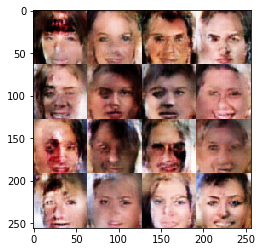

Epoch 1/1 - Batch 1610/6331:  Discriminator loss = 0.9944  Generator loss = 0.9209
Epoch 1/1 - Batch 1620/6331:  Discriminator loss = 1.5223  Generator loss = 3.1588
Epoch 1/1 - Batch 1630/6331:  Discriminator loss = 0.7069  Generator loss = 1.5991
Epoch 1/1 - Batch 1640/6331:  Discriminator loss = 0.9467  Generator loss = 1.6937
Epoch 1/1 - Batch 1650/6331:  Discriminator loss = 1.1055  Generator loss = 0.8010
Epoch 1/1 - Batch 1660/6331:  Discriminator loss = 0.6335  Generator loss = 1.9193
Epoch 1/1 - Batch 1670/6331:  Discriminator loss = 1.0534  Generator loss = 1.0709
Epoch 1/1 - Batch 1680/6331:  Discriminator loss = 1.4204  Generator loss = 0.5475
Epoch 1/1 - Batch 1690/6331:  Discriminator loss = 1.7225  Generator loss = 2.6939
Epoch 1/1 - Batch 1700/6331:  Discriminator loss = 1.4511  Generator loss = 0.5288


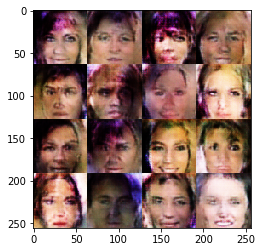

Epoch 1/1 - Batch 1710/6331:  Discriminator loss = 0.9063  Generator loss = 1.0199
Epoch 1/1 - Batch 1720/6331:  Discriminator loss = 0.8022  Generator loss = 1.5924
Epoch 1/1 - Batch 1730/6331:  Discriminator loss = 0.9900  Generator loss = 0.8875
Epoch 1/1 - Batch 1740/6331:  Discriminator loss = 0.9620  Generator loss = 1.0039
Epoch 1/1 - Batch 1750/6331:  Discriminator loss = 1.1767  Generator loss = 0.7203
Epoch 1/1 - Batch 1760/6331:  Discriminator loss = 0.8055  Generator loss = 2.3570
Epoch 1/1 - Batch 1770/6331:  Discriminator loss = 1.0582  Generator loss = 0.7918
Epoch 1/1 - Batch 1780/6331:  Discriminator loss = 0.6689  Generator loss = 1.9455
Epoch 1/1 - Batch 1790/6331:  Discriminator loss = 1.0406  Generator loss = 2.3114
Epoch 1/1 - Batch 1800/6331:  Discriminator loss = 0.9254  Generator loss = 1.8434


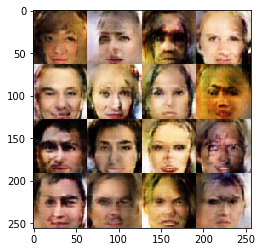

Epoch 1/1 - Batch 1810/6331:  Discriminator loss = 1.3984  Generator loss = 0.5055
Epoch 1/1 - Batch 1820/6331:  Discriminator loss = 0.8563  Generator loss = 1.7943
Epoch 1/1 - Batch 1830/6331:  Discriminator loss = 0.9257  Generator loss = 0.9825
Epoch 1/1 - Batch 1840/6331:  Discriminator loss = 0.8826  Generator loss = 1.0011
Epoch 1/1 - Batch 1850/6331:  Discriminator loss = 0.6548  Generator loss = 1.8340
Epoch 1/1 - Batch 1860/6331:  Discriminator loss = 0.9925  Generator loss = 1.0113
Epoch 1/1 - Batch 1870/6331:  Discriminator loss = 0.8895  Generator loss = 1.0359
Epoch 1/1 - Batch 1880/6331:  Discriminator loss = 1.7518  Generator loss = 0.3486
Epoch 1/1 - Batch 1890/6331:  Discriminator loss = 0.9557  Generator loss = 2.3668
Epoch 1/1 - Batch 1900/6331:  Discriminator loss = 0.6029  Generator loss = 2.2587


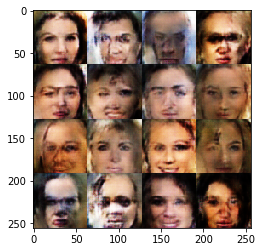

Epoch 1/1 - Batch 1910/6331:  Discriminator loss = 0.7150  Generator loss = 1.8450
Epoch 1/1 - Batch 1920/6331:  Discriminator loss = 1.0609  Generator loss = 2.1075
Epoch 1/1 - Batch 1930/6331:  Discriminator loss = 0.9113  Generator loss = 1.1476
Epoch 1/1 - Batch 1940/6331:  Discriminator loss = 1.0453  Generator loss = 0.8309
Epoch 1/1 - Batch 1950/6331:  Discriminator loss = 0.8760  Generator loss = 1.6328
Epoch 1/1 - Batch 1960/6331:  Discriminator loss = 0.8223  Generator loss = 1.2510
Epoch 1/1 - Batch 1970/6331:  Discriminator loss = 0.8708  Generator loss = 1.9291
Epoch 1/1 - Batch 1980/6331:  Discriminator loss = 1.0058  Generator loss = 0.9278
Epoch 1/1 - Batch 1990/6331:  Discriminator loss = 0.8297  Generator loss = 1.5634
Epoch 1/1 - Batch 2000/6331:  Discriminator loss = 0.7935  Generator loss = 2.6984


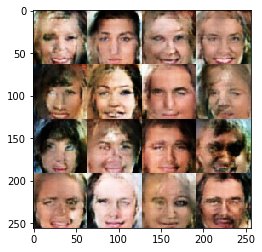

Epoch 1/1 - Batch 2010/6331:  Discriminator loss = 1.4603  Generator loss = 0.4750
Epoch 1/1 - Batch 2020/6331:  Discriminator loss = 1.4058  Generator loss = 0.4924
Epoch 1/1 - Batch 2030/6331:  Discriminator loss = 0.8840  Generator loss = 1.5278
Epoch 1/1 - Batch 2040/6331:  Discriminator loss = 1.2586  Generator loss = 0.6148
Epoch 1/1 - Batch 2050/6331:  Discriminator loss = 0.8342  Generator loss = 1.6713
Epoch 1/1 - Batch 2060/6331:  Discriminator loss = 1.2022  Generator loss = 0.6966
Epoch 1/1 - Batch 2070/6331:  Discriminator loss = 1.5658  Generator loss = 0.4135
Epoch 1/1 - Batch 2080/6331:  Discriminator loss = 1.3138  Generator loss = 0.6231
Epoch 1/1 - Batch 2090/6331:  Discriminator loss = 1.3481  Generator loss = 0.5225
Epoch 1/1 - Batch 2100/6331:  Discriminator loss = 1.1682  Generator loss = 0.7922


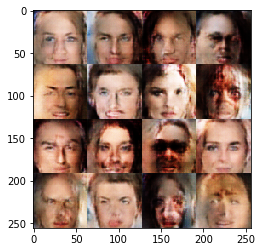

Epoch 1/1 - Batch 2110/6331:  Discriminator loss = 0.9242  Generator loss = 1.0023
Epoch 1/1 - Batch 2120/6331:  Discriminator loss = 0.7942  Generator loss = 1.4226
Epoch 1/1 - Batch 2130/6331:  Discriminator loss = 0.6957  Generator loss = 1.6851
Epoch 1/1 - Batch 2140/6331:  Discriminator loss = 1.1655  Generator loss = 1.3098
Epoch 1/1 - Batch 2150/6331:  Discriminator loss = 1.1036  Generator loss = 0.9470
Epoch 1/1 - Batch 2160/6331:  Discriminator loss = 0.8251  Generator loss = 1.7379
Epoch 1/1 - Batch 2170/6331:  Discriminator loss = 1.6091  Generator loss = 0.4041
Epoch 1/1 - Batch 2180/6331:  Discriminator loss = 1.0158  Generator loss = 0.9025
Epoch 1/1 - Batch 2190/6331:  Discriminator loss = 0.7775  Generator loss = 1.6528
Epoch 1/1 - Batch 2200/6331:  Discriminator loss = 1.0125  Generator loss = 0.8341


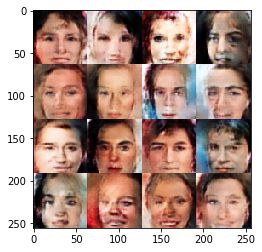

Epoch 1/1 - Batch 2210/6331:  Discriminator loss = 0.8298  Generator loss = 1.1803
Epoch 1/1 - Batch 2220/6331:  Discriminator loss = 0.6912  Generator loss = 1.6976
Epoch 1/1 - Batch 2230/6331:  Discriminator loss = 0.6546  Generator loss = 1.9736
Epoch 1/1 - Batch 2240/6331:  Discriminator loss = 1.1212  Generator loss = 3.0825
Epoch 1/1 - Batch 2250/6331:  Discriminator loss = 0.6166  Generator loss = 1.9492
Epoch 1/1 - Batch 2260/6331:  Discriminator loss = 1.1609  Generator loss = 0.8114
Epoch 1/1 - Batch 2270/6331:  Discriminator loss = 1.4057  Generator loss = 0.5061
Epoch 1/1 - Batch 2280/6331:  Discriminator loss = 1.6244  Generator loss = 0.3889
Epoch 1/1 - Batch 2290/6331:  Discriminator loss = 0.9767  Generator loss = 0.9075
Epoch 1/1 - Batch 2300/6331:  Discriminator loss = 0.7892  Generator loss = 1.7867


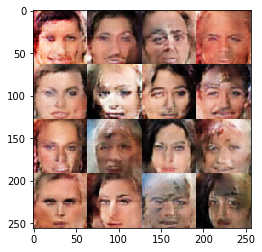

Epoch 1/1 - Batch 2310/6331:  Discriminator loss = 0.7810  Generator loss = 1.5698
Epoch 1/1 - Batch 2320/6331:  Discriminator loss = 1.5029  Generator loss = 0.4374
Epoch 1/1 - Batch 2330/6331:  Discriminator loss = 1.0969  Generator loss = 0.7379
Epoch 1/1 - Batch 2340/6331:  Discriminator loss = 0.8797  Generator loss = 1.4592
Epoch 1/1 - Batch 2350/6331:  Discriminator loss = 0.9391  Generator loss = 1.2980
Epoch 1/1 - Batch 2360/6331:  Discriminator loss = 0.7450  Generator loss = 1.6010
Epoch 1/1 - Batch 2370/6331:  Discriminator loss = 0.7380  Generator loss = 2.1479
Epoch 1/1 - Batch 2380/6331:  Discriminator loss = 0.9410  Generator loss = 1.0349
Epoch 1/1 - Batch 2390/6331:  Discriminator loss = 0.8683  Generator loss = 1.3991
Epoch 1/1 - Batch 2400/6331:  Discriminator loss = 2.1934  Generator loss = 3.2348


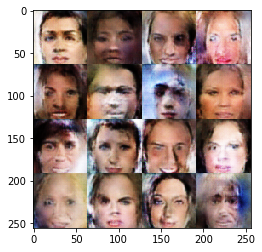

Epoch 1/1 - Batch 2410/6331:  Discriminator loss = 0.9335  Generator loss = 2.5672
Epoch 1/1 - Batch 2420/6331:  Discriminator loss = 0.8220  Generator loss = 1.5550
Epoch 1/1 - Batch 2430/6331:  Discriminator loss = 0.9493  Generator loss = 1.0183
Epoch 1/1 - Batch 2440/6331:  Discriminator loss = 0.8580  Generator loss = 1.2736
Epoch 1/1 - Batch 2450/6331:  Discriminator loss = 1.1070  Generator loss = 1.0426
Epoch 1/1 - Batch 2460/6331:  Discriminator loss = 0.8755  Generator loss = 1.4013
Epoch 1/1 - Batch 2470/6331:  Discriminator loss = 0.9652  Generator loss = 1.0442
Epoch 1/1 - Batch 2480/6331:  Discriminator loss = 1.6119  Generator loss = 0.3954
Epoch 1/1 - Batch 2490/6331:  Discriminator loss = 0.9030  Generator loss = 1.1720
Epoch 1/1 - Batch 2500/6331:  Discriminator loss = 0.7475  Generator loss = 1.9184


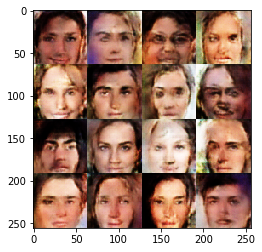

Epoch 1/1 - Batch 2510/6331:  Discriminator loss = 1.0581  Generator loss = 0.7546
Epoch 1/1 - Batch 2520/6331:  Discriminator loss = 0.8794  Generator loss = 1.0868
Epoch 1/1 - Batch 2530/6331:  Discriminator loss = 0.9072  Generator loss = 1.1238
Epoch 1/1 - Batch 2540/6331:  Discriminator loss = 0.7671  Generator loss = 1.4383
Epoch 1/1 - Batch 2550/6331:  Discriminator loss = 0.9682  Generator loss = 2.4601
Epoch 1/1 - Batch 2560/6331:  Discriminator loss = 1.3133  Generator loss = 2.8850
Epoch 1/1 - Batch 2570/6331:  Discriminator loss = 1.0046  Generator loss = 0.9199
Epoch 1/1 - Batch 2580/6331:  Discriminator loss = 1.0611  Generator loss = 0.7753
Epoch 1/1 - Batch 2590/6331:  Discriminator loss = 0.8639  Generator loss = 1.2429
Epoch 1/1 - Batch 2600/6331:  Discriminator loss = 0.9387  Generator loss = 1.0327


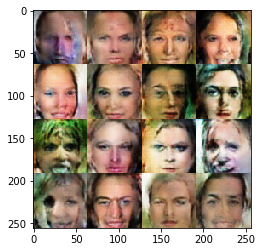

Epoch 1/1 - Batch 2610/6331:  Discriminator loss = 1.0731  Generator loss = 0.8594
Epoch 1/1 - Batch 2620/6331:  Discriminator loss = 0.9454  Generator loss = 1.0420
Epoch 1/1 - Batch 2630/6331:  Discriminator loss = 1.1517  Generator loss = 0.6761
Epoch 1/1 - Batch 2640/6331:  Discriminator loss = 0.8743  Generator loss = 1.8164
Epoch 1/1 - Batch 2650/6331:  Discriminator loss = 0.8415  Generator loss = 1.1988
Epoch 1/1 - Batch 2660/6331:  Discriminator loss = 0.8674  Generator loss = 1.3120
Epoch 1/1 - Batch 2670/6331:  Discriminator loss = 0.9199  Generator loss = 1.4383
Epoch 1/1 - Batch 2680/6331:  Discriminator loss = 0.6963  Generator loss = 1.8243
Epoch 1/1 - Batch 2690/6331:  Discriminator loss = 0.9532  Generator loss = 0.8686
Epoch 1/1 - Batch 2700/6331:  Discriminator loss = 0.9065  Generator loss = 1.1258


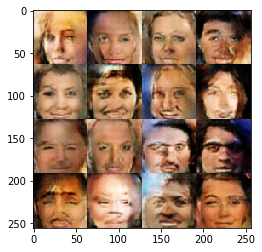

Epoch 1/1 - Batch 2710/6331:  Discriminator loss = 0.7840  Generator loss = 1.3365
Epoch 1/1 - Batch 2720/6331:  Discriminator loss = 0.9235  Generator loss = 1.6234
Epoch 1/1 - Batch 2730/6331:  Discriminator loss = 1.0265  Generator loss = 1.6880
Epoch 1/1 - Batch 2740/6331:  Discriminator loss = 0.9329  Generator loss = 1.2685
Epoch 1/1 - Batch 2750/6331:  Discriminator loss = 0.7626  Generator loss = 2.6545
Epoch 1/1 - Batch 2760/6331:  Discriminator loss = 1.0139  Generator loss = 1.7504
Epoch 1/1 - Batch 2770/6331:  Discriminator loss = 0.7902  Generator loss = 1.4101
Epoch 1/1 - Batch 2780/6331:  Discriminator loss = 0.8552  Generator loss = 1.1578
Epoch 1/1 - Batch 2790/6331:  Discriminator loss = 1.0910  Generator loss = 0.7424
Epoch 1/1 - Batch 2800/6331:  Discriminator loss = 0.8125  Generator loss = 1.4957


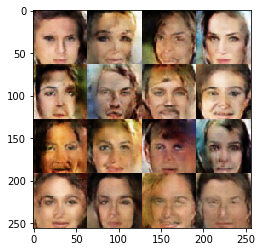

Epoch 1/1 - Batch 2810/6331:  Discriminator loss = 0.8750  Generator loss = 1.1207
Epoch 1/1 - Batch 2820/6331:  Discriminator loss = 0.6733  Generator loss = 1.7314
Epoch 1/1 - Batch 2830/6331:  Discriminator loss = 0.9659  Generator loss = 1.6810
Epoch 1/1 - Batch 2840/6331:  Discriminator loss = 0.8141  Generator loss = 1.5028
Epoch 1/1 - Batch 2850/6331:  Discriminator loss = 0.6923  Generator loss = 1.9950
Epoch 1/1 - Batch 2860/6331:  Discriminator loss = 0.7203  Generator loss = 1.4914
Epoch 1/1 - Batch 2870/6331:  Discriminator loss = 0.8576  Generator loss = 1.7676
Epoch 1/1 - Batch 2880/6331:  Discriminator loss = 0.7493  Generator loss = 1.4271
Epoch 1/1 - Batch 2890/6331:  Discriminator loss = 0.8939  Generator loss = 1.7780
Epoch 1/1 - Batch 2900/6331:  Discriminator loss = 0.9479  Generator loss = 0.9769


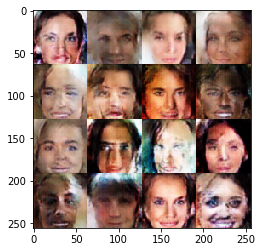

Epoch 1/1 - Batch 2910/6331:  Discriminator loss = 0.8525  Generator loss = 1.2457
Epoch 1/1 - Batch 2920/6331:  Discriminator loss = 0.9490  Generator loss = 1.1736
Epoch 1/1 - Batch 2930/6331:  Discriminator loss = 0.7937  Generator loss = 1.9278
Epoch 1/1 - Batch 2940/6331:  Discriminator loss = 0.9171  Generator loss = 1.1233
Epoch 1/1 - Batch 2950/6331:  Discriminator loss = 1.2851  Generator loss = 0.5501
Epoch 1/1 - Batch 2960/6331:  Discriminator loss = 0.6417  Generator loss = 1.8820
Epoch 1/1 - Batch 2970/6331:  Discriminator loss = 0.8206  Generator loss = 1.2181
Epoch 1/1 - Batch 2980/6331:  Discriminator loss = 0.9052  Generator loss = 1.0056
Epoch 1/1 - Batch 2990/6331:  Discriminator loss = 1.1221  Generator loss = 3.3309
Epoch 1/1 - Batch 3000/6331:  Discriminator loss = 0.8291  Generator loss = 1.2032


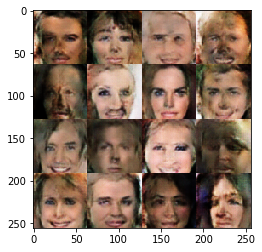

Epoch 1/1 - Batch 3010/6331:  Discriminator loss = 0.8392  Generator loss = 2.0125
Epoch 1/1 - Batch 3020/6331:  Discriminator loss = 1.1772  Generator loss = 0.6603
Epoch 1/1 - Batch 3030/6331:  Discriminator loss = 1.0077  Generator loss = 0.8630
Epoch 1/1 - Batch 3040/6331:  Discriminator loss = 1.1315  Generator loss = 0.7261
Epoch 1/1 - Batch 3050/6331:  Discriminator loss = 0.8528  Generator loss = 1.2320
Epoch 1/1 - Batch 3060/6331:  Discriminator loss = 1.8128  Generator loss = 0.3123
Epoch 1/1 - Batch 3070/6331:  Discriminator loss = 1.4842  Generator loss = 0.4533
Epoch 1/1 - Batch 3080/6331:  Discriminator loss = 2.0495  Generator loss = 3.0497
Epoch 1/1 - Batch 3090/6331:  Discriminator loss = 1.5470  Generator loss = 0.4652
Epoch 1/1 - Batch 3100/6331:  Discriminator loss = 1.0924  Generator loss = 0.7738


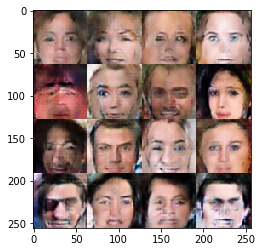

Epoch 1/1 - Batch 3110/6331:  Discriminator loss = 1.3285  Generator loss = 0.5790
Epoch 1/1 - Batch 3120/6331:  Discriminator loss = 1.3019  Generator loss = 0.5883
Epoch 1/1 - Batch 3130/6331:  Discriminator loss = 1.2655  Generator loss = 0.5755
Epoch 1/1 - Batch 3140/6331:  Discriminator loss = 0.6552  Generator loss = 1.8269
Epoch 1/1 - Batch 3150/6331:  Discriminator loss = 0.9222  Generator loss = 1.0781
Epoch 1/1 - Batch 3160/6331:  Discriminator loss = 0.7335  Generator loss = 1.5801
Epoch 1/1 - Batch 3170/6331:  Discriminator loss = 0.6636  Generator loss = 1.9529
Epoch 1/1 - Batch 3180/6331:  Discriminator loss = 1.0440  Generator loss = 0.9171
Epoch 1/1 - Batch 3190/6331:  Discriminator loss = 0.9195  Generator loss = 1.3281
Epoch 1/1 - Batch 3200/6331:  Discriminator loss = 1.0328  Generator loss = 0.7826


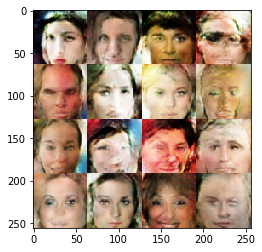

Epoch 1/1 - Batch 3210/6331:  Discriminator loss = 0.8492  Generator loss = 1.8261
Epoch 1/1 - Batch 3220/6331:  Discriminator loss = 0.9840  Generator loss = 0.8646
Epoch 1/1 - Batch 3230/6331:  Discriminator loss = 0.9856  Generator loss = 1.0731
Epoch 1/1 - Batch 3240/6331:  Discriminator loss = 1.3724  Generator loss = 0.5027
Epoch 1/1 - Batch 3250/6331:  Discriminator loss = 1.2807  Generator loss = 0.5584
Epoch 1/1 - Batch 3260/6331:  Discriminator loss = 1.4737  Generator loss = 0.4645
Epoch 1/1 - Batch 3270/6331:  Discriminator loss = 0.8094  Generator loss = 1.3165
Epoch 1/1 - Batch 3280/6331:  Discriminator loss = 1.0686  Generator loss = 0.9921
Epoch 1/1 - Batch 3290/6331:  Discriminator loss = 0.6969  Generator loss = 1.5503
Epoch 1/1 - Batch 3300/6331:  Discriminator loss = 0.8564  Generator loss = 1.4020


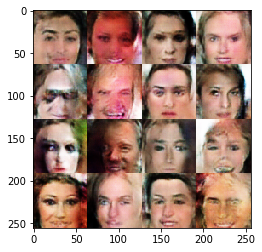

Epoch 1/1 - Batch 3310/6331:  Discriminator loss = 0.8911  Generator loss = 1.0301
Epoch 1/1 - Batch 3320/6331:  Discriminator loss = 0.9234  Generator loss = 1.0156
Epoch 1/1 - Batch 3330/6331:  Discriminator loss = 1.0911  Generator loss = 0.8259
Epoch 1/1 - Batch 3340/6331:  Discriminator loss = 0.8981  Generator loss = 1.1266
Epoch 1/1 - Batch 3350/6331:  Discriminator loss = 2.0920  Generator loss = 4.1969
Epoch 1/1 - Batch 3360/6331:  Discriminator loss = 0.8940  Generator loss = 1.1814
Epoch 1/1 - Batch 3370/6331:  Discriminator loss = 0.9740  Generator loss = 0.9666
Epoch 1/1 - Batch 3380/6331:  Discriminator loss = 0.8211  Generator loss = 1.2546
Epoch 1/1 - Batch 3390/6331:  Discriminator loss = 1.0173  Generator loss = 0.8771
Epoch 1/1 - Batch 3400/6331:  Discriminator loss = 0.7378  Generator loss = 1.4259


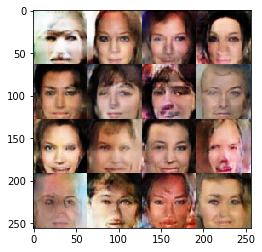

Epoch 1/1 - Batch 3410/6331:  Discriminator loss = 1.2790  Generator loss = 0.5757
Epoch 1/1 - Batch 3420/6331:  Discriminator loss = 0.9052  Generator loss = 1.6435
Epoch 1/1 - Batch 3430/6331:  Discriminator loss = 0.9962  Generator loss = 1.0483
Epoch 1/1 - Batch 3440/6331:  Discriminator loss = 0.8565  Generator loss = 1.9549
Epoch 1/1 - Batch 3450/6331:  Discriminator loss = 1.2824  Generator loss = 0.5638
Epoch 1/1 - Batch 3460/6331:  Discriminator loss = 0.7603  Generator loss = 1.4154
Epoch 1/1 - Batch 3470/6331:  Discriminator loss = 0.8401  Generator loss = 1.9814
Epoch 1/1 - Batch 3480/6331:  Discriminator loss = 1.1265  Generator loss = 0.7312
Epoch 1/1 - Batch 3490/6331:  Discriminator loss = 0.9221  Generator loss = 1.0732
Epoch 1/1 - Batch 3500/6331:  Discriminator loss = 0.7493  Generator loss = 1.8342


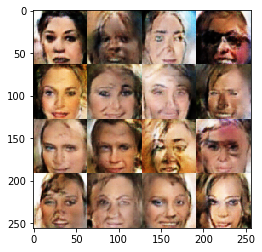

Epoch 1/1 - Batch 3510/6331:  Discriminator loss = 1.2416  Generator loss = 0.6398
Epoch 1/1 - Batch 3520/6331:  Discriminator loss = 0.8222  Generator loss = 1.1247
Epoch 1/1 - Batch 3530/6331:  Discriminator loss = 1.1877  Generator loss = 1.6477
Epoch 1/1 - Batch 3540/6331:  Discriminator loss = 1.5670  Generator loss = 0.4270
Epoch 1/1 - Batch 3550/6331:  Discriminator loss = 1.0778  Generator loss = 1.0340
Epoch 1/1 - Batch 3560/6331:  Discriminator loss = 1.2614  Generator loss = 0.5669
Epoch 1/1 - Batch 3570/6331:  Discriminator loss = 0.8572  Generator loss = 1.1648
Epoch 1/1 - Batch 3580/6331:  Discriminator loss = 1.1297  Generator loss = 1.2794
Epoch 1/1 - Batch 3590/6331:  Discriminator loss = 0.9015  Generator loss = 1.3002
Epoch 1/1 - Batch 3600/6331:  Discriminator loss = 0.8376  Generator loss = 1.3809


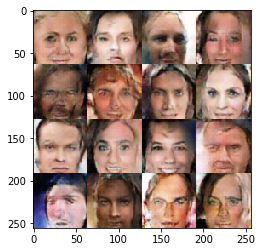

Epoch 1/1 - Batch 3610/6331:  Discriminator loss = 1.4450  Generator loss = 0.4622
Epoch 1/1 - Batch 3620/6331:  Discriminator loss = 1.5282  Generator loss = 0.4314
Epoch 1/1 - Batch 3630/6331:  Discriminator loss = 0.9421  Generator loss = 0.9637
Epoch 1/1 - Batch 3640/6331:  Discriminator loss = 0.8309  Generator loss = 1.3673
Epoch 1/1 - Batch 3650/6331:  Discriminator loss = 0.9087  Generator loss = 1.0561
Epoch 1/1 - Batch 3660/6331:  Discriminator loss = 0.8589  Generator loss = 1.0342
Epoch 1/1 - Batch 3670/6331:  Discriminator loss = 1.0098  Generator loss = 0.8905
Epoch 1/1 - Batch 3680/6331:  Discriminator loss = 1.4375  Generator loss = 0.5197
Epoch 1/1 - Batch 3690/6331:  Discriminator loss = 0.8152  Generator loss = 1.3103
Epoch 1/1 - Batch 3700/6331:  Discriminator loss = 0.8365  Generator loss = 1.2398


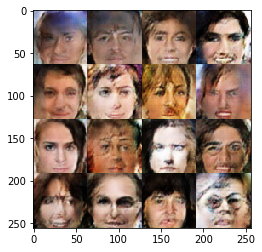

Epoch 1/1 - Batch 3710/6331:  Discriminator loss = 0.8986  Generator loss = 1.2925
Epoch 1/1 - Batch 3720/6331:  Discriminator loss = 0.9764  Generator loss = 2.0762
Epoch 1/1 - Batch 3730/6331:  Discriminator loss = 0.8371  Generator loss = 1.1351
Epoch 1/1 - Batch 3740/6331:  Discriminator loss = 1.0133  Generator loss = 0.9648
Epoch 1/1 - Batch 3750/6331:  Discriminator loss = 1.0049  Generator loss = 0.8050
Epoch 1/1 - Batch 3760/6331:  Discriminator loss = 0.9401  Generator loss = 1.0263
Epoch 1/1 - Batch 3770/6331:  Discriminator loss = 0.7844  Generator loss = 1.3957
Epoch 1/1 - Batch 3780/6331:  Discriminator loss = 2.3858  Generator loss = 4.2737
Epoch 1/1 - Batch 3790/6331:  Discriminator loss = 1.4095  Generator loss = 0.8582
Epoch 1/1 - Batch 3800/6331:  Discriminator loss = 0.8293  Generator loss = 2.0789


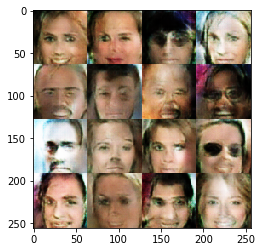

Epoch 1/1 - Batch 3810/6331:  Discriminator loss = 0.8237  Generator loss = 1.1412
Epoch 1/1 - Batch 3820/6331:  Discriminator loss = 0.9679  Generator loss = 0.8796
Epoch 1/1 - Batch 3830/6331:  Discriminator loss = 0.9116  Generator loss = 1.1031
Epoch 1/1 - Batch 3840/6331:  Discriminator loss = 1.4322  Generator loss = 0.4710
Epoch 1/1 - Batch 3850/6331:  Discriminator loss = 1.1328  Generator loss = 0.7111
Epoch 1/1 - Batch 3860/6331:  Discriminator loss = 0.7524  Generator loss = 1.4848
Epoch 1/1 - Batch 3870/6331:  Discriminator loss = 1.3350  Generator loss = 1.9847
Epoch 1/1 - Batch 3880/6331:  Discriminator loss = 1.3650  Generator loss = 0.5332
Epoch 1/1 - Batch 3890/6331:  Discriminator loss = 0.9818  Generator loss = 1.5502
Epoch 1/1 - Batch 3900/6331:  Discriminator loss = 1.1641  Generator loss = 2.0790


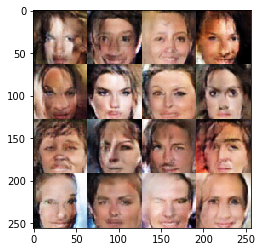

Epoch 1/1 - Batch 3910/6331:  Discriminator loss = 1.4038  Generator loss = 0.5046
Epoch 1/1 - Batch 3920/6331:  Discriminator loss = 1.1172  Generator loss = 0.7130
Epoch 1/1 - Batch 3930/6331:  Discriminator loss = 1.0674  Generator loss = 2.4219
Epoch 1/1 - Batch 3940/6331:  Discriminator loss = 1.3735  Generator loss = 0.5383
Epoch 1/1 - Batch 3950/6331:  Discriminator loss = 1.0431  Generator loss = 0.8645
Epoch 1/1 - Batch 3960/6331:  Discriminator loss = 0.8539  Generator loss = 1.5491
Epoch 1/1 - Batch 3970/6331:  Discriminator loss = 0.9248  Generator loss = 1.1174
Epoch 1/1 - Batch 3980/6331:  Discriminator loss = 1.0620  Generator loss = 0.8757
Epoch 1/1 - Batch 3990/6331:  Discriminator loss = 0.7949  Generator loss = 1.3207
Epoch 1/1 - Batch 4000/6331:  Discriminator loss = 0.9318  Generator loss = 1.0276


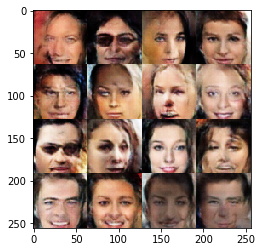

Epoch 1/1 - Batch 4010/6331:  Discriminator loss = 0.9212  Generator loss = 0.9863
Epoch 1/1 - Batch 4020/6331:  Discriminator loss = 1.3218  Generator loss = 0.6242
Epoch 1/1 - Batch 4030/6331:  Discriminator loss = 0.8331  Generator loss = 1.1437
Epoch 1/1 - Batch 4040/6331:  Discriminator loss = 1.5401  Generator loss = 0.4766
Epoch 1/1 - Batch 4050/6331:  Discriminator loss = 1.0908  Generator loss = 0.7794
Epoch 1/1 - Batch 4060/6331:  Discriminator loss = 0.7116  Generator loss = 1.4962
Epoch 1/1 - Batch 4070/6331:  Discriminator loss = 0.8826  Generator loss = 1.0884
Epoch 1/1 - Batch 4080/6331:  Discriminator loss = 1.3059  Generator loss = 0.6215
Epoch 1/1 - Batch 4090/6331:  Discriminator loss = 1.0458  Generator loss = 0.8640
Epoch 1/1 - Batch 4100/6331:  Discriminator loss = 0.6902  Generator loss = 2.2847


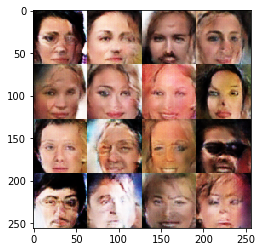

Epoch 1/1 - Batch 4110/6331:  Discriminator loss = 1.2751  Generator loss = 2.9231
Epoch 1/1 - Batch 4120/6331:  Discriminator loss = 0.9761  Generator loss = 1.0833
Epoch 1/1 - Batch 4130/6331:  Discriminator loss = 0.9165  Generator loss = 1.9310
Epoch 1/1 - Batch 4140/6331:  Discriminator loss = 0.9722  Generator loss = 0.9235
Epoch 1/1 - Batch 4150/6331:  Discriminator loss = 0.7716  Generator loss = 1.4207
Epoch 1/1 - Batch 4160/6331:  Discriminator loss = 0.9575  Generator loss = 2.0127
Epoch 1/1 - Batch 4170/6331:  Discriminator loss = 1.9026  Generator loss = 0.3874
Epoch 1/1 - Batch 4180/6331:  Discriminator loss = 0.6833  Generator loss = 1.5193
Epoch 1/1 - Batch 4190/6331:  Discriminator loss = 0.8354  Generator loss = 1.2442
Epoch 1/1 - Batch 4200/6331:  Discriminator loss = 0.8653  Generator loss = 1.2651


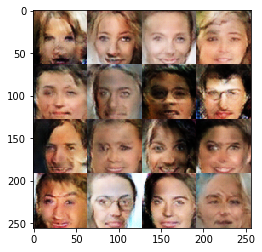

Epoch 1/1 - Batch 4210/6331:  Discriminator loss = 0.8690  Generator loss = 1.3287
Epoch 1/1 - Batch 4220/6331:  Discriminator loss = 1.1317  Generator loss = 0.7170
Epoch 1/1 - Batch 4230/6331:  Discriminator loss = 0.9101  Generator loss = 2.0342
Epoch 1/1 - Batch 4240/6331:  Discriminator loss = 0.7831  Generator loss = 1.5941
Epoch 1/1 - Batch 4250/6331:  Discriminator loss = 1.0975  Generator loss = 0.8882
Epoch 1/1 - Batch 4260/6331:  Discriminator loss = 1.4495  Generator loss = 0.4868
Epoch 1/1 - Batch 4270/6331:  Discriminator loss = 0.8952  Generator loss = 1.0399
Epoch 1/1 - Batch 4280/6331:  Discriminator loss = 1.0683  Generator loss = 0.7797
Epoch 1/1 - Batch 4290/6331:  Discriminator loss = 1.7937  Generator loss = 0.3229
Epoch 1/1 - Batch 4300/6331:  Discriminator loss = 1.0921  Generator loss = 2.5291


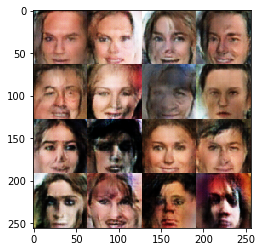

Epoch 1/1 - Batch 4310/6331:  Discriminator loss = 0.7937  Generator loss = 1.6058
Epoch 1/1 - Batch 4320/6331:  Discriminator loss = 0.7970  Generator loss = 1.4226
Epoch 1/1 - Batch 4330/6331:  Discriminator loss = 1.5998  Generator loss = 0.4257
Epoch 1/1 - Batch 4340/6331:  Discriminator loss = 1.2099  Generator loss = 0.6576
Epoch 1/1 - Batch 4350/6331:  Discriminator loss = 0.8497  Generator loss = 1.1784
Epoch 1/1 - Batch 4360/6331:  Discriminator loss = 0.8481  Generator loss = 1.3592
Epoch 1/1 - Batch 4370/6331:  Discriminator loss = 1.2286  Generator loss = 0.6487
Epoch 1/1 - Batch 4380/6331:  Discriminator loss = 1.3397  Generator loss = 0.5559
Epoch 1/1 - Batch 4390/6331:  Discriminator loss = 1.4200  Generator loss = 0.4578
Epoch 1/1 - Batch 4400/6331:  Discriminator loss = 2.0239  Generator loss = 0.2686


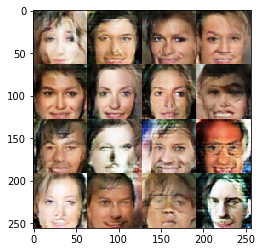

Epoch 1/1 - Batch 4410/6331:  Discriminator loss = 0.8079  Generator loss = 1.8997
Epoch 1/1 - Batch 4420/6331:  Discriminator loss = 1.0475  Generator loss = 0.9320
Epoch 1/1 - Batch 4430/6331:  Discriminator loss = 0.8592  Generator loss = 1.3205
Epoch 1/1 - Batch 4440/6331:  Discriminator loss = 1.9710  Generator loss = 0.2876
Epoch 1/1 - Batch 4450/6331:  Discriminator loss = 1.2658  Generator loss = 2.0355
Epoch 1/1 - Batch 4460/6331:  Discriminator loss = 1.4711  Generator loss = 0.4711
Epoch 1/1 - Batch 4470/6331:  Discriminator loss = 1.1502  Generator loss = 0.7947
Epoch 1/1 - Batch 4480/6331:  Discriminator loss = 0.7568  Generator loss = 1.3205
Epoch 1/1 - Batch 4490/6331:  Discriminator loss = 0.9424  Generator loss = 1.0743
Epoch 1/1 - Batch 4500/6331:  Discriminator loss = 1.0697  Generator loss = 0.7941


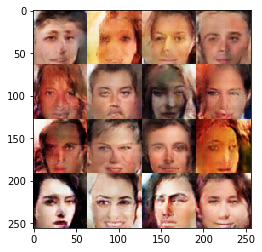

Epoch 1/1 - Batch 4510/6331:  Discriminator loss = 1.0140  Generator loss = 0.8538
Epoch 1/1 - Batch 4520/6331:  Discriminator loss = 0.7517  Generator loss = 1.7145
Epoch 1/1 - Batch 4530/6331:  Discriminator loss = 0.8439  Generator loss = 1.1690
Epoch 1/1 - Batch 4540/6331:  Discriminator loss = 0.6661  Generator loss = 1.5552
Epoch 1/1 - Batch 4550/6331:  Discriminator loss = 0.8715  Generator loss = 1.0482
Epoch 1/1 - Batch 4560/6331:  Discriminator loss = 0.8977  Generator loss = 1.9493
Epoch 1/1 - Batch 4570/6331:  Discriminator loss = 1.8208  Generator loss = 0.3141
Epoch 1/1 - Batch 4580/6331:  Discriminator loss = 1.6035  Generator loss = 3.0345
Epoch 1/1 - Batch 4590/6331:  Discriminator loss = 0.8886  Generator loss = 1.0165
Epoch 1/1 - Batch 4600/6331:  Discriminator loss = 0.7306  Generator loss = 2.1298


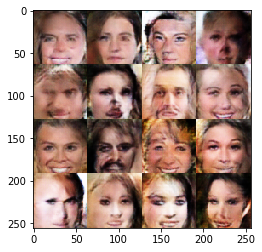

Epoch 1/1 - Batch 4610/6331:  Discriminator loss = 1.4500  Generator loss = 0.5108
Epoch 1/1 - Batch 4620/6331:  Discriminator loss = 1.0255  Generator loss = 1.0209
Epoch 1/1 - Batch 4630/6331:  Discriminator loss = 0.8540  Generator loss = 1.0577
Epoch 1/1 - Batch 4640/6331:  Discriminator loss = 1.8775  Generator loss = 0.2969
Epoch 1/1 - Batch 4650/6331:  Discriminator loss = 0.7897  Generator loss = 1.3426
Epoch 1/1 - Batch 4660/6331:  Discriminator loss = 1.1102  Generator loss = 0.7730
Epoch 1/1 - Batch 4670/6331:  Discriminator loss = 0.6406  Generator loss = 1.5871
Epoch 1/1 - Batch 4680/6331:  Discriminator loss = 0.7882  Generator loss = 1.5159
Epoch 1/1 - Batch 4690/6331:  Discriminator loss = 1.2799  Generator loss = 0.5859
Epoch 1/1 - Batch 4700/6331:  Discriminator loss = 1.0674  Generator loss = 0.8572


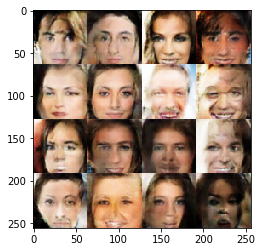

Epoch 1/1 - Batch 4710/6331:  Discriminator loss = 0.7459  Generator loss = 1.5219
Epoch 1/1 - Batch 4720/6331:  Discriminator loss = 0.9881  Generator loss = 0.8510
Epoch 1/1 - Batch 4730/6331:  Discriminator loss = 0.7054  Generator loss = 1.3561
Epoch 1/1 - Batch 4740/6331:  Discriminator loss = 1.4011  Generator loss = 2.8317
Epoch 1/1 - Batch 4750/6331:  Discriminator loss = 1.6190  Generator loss = 0.3769
Epoch 1/1 - Batch 4760/6331:  Discriminator loss = 0.7292  Generator loss = 1.3470
Epoch 1/1 - Batch 4770/6331:  Discriminator loss = 1.1462  Generator loss = 0.6590
Epoch 1/1 - Batch 4780/6331:  Discriminator loss = 0.8912  Generator loss = 0.9604
Epoch 1/1 - Batch 4790/6331:  Discriminator loss = 0.8371  Generator loss = 1.1755
Epoch 1/1 - Batch 4800/6331:  Discriminator loss = 1.1110  Generator loss = 0.7469


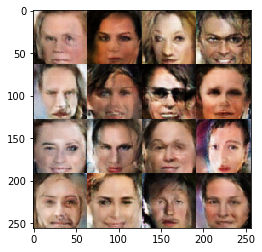

Epoch 1/1 - Batch 4810/6331:  Discriminator loss = 0.7402  Generator loss = 1.5438
Epoch 1/1 - Batch 4820/6331:  Discriminator loss = 0.8939  Generator loss = 1.4676
Epoch 1/1 - Batch 4830/6331:  Discriminator loss = 1.2176  Generator loss = 0.6398
Epoch 1/1 - Batch 4840/6331:  Discriminator loss = 0.7424  Generator loss = 1.5642
Epoch 1/1 - Batch 4850/6331:  Discriminator loss = 0.6548  Generator loss = 1.6835
Epoch 1/1 - Batch 4860/6331:  Discriminator loss = 0.8292  Generator loss = 1.1810
Epoch 1/1 - Batch 4870/6331:  Discriminator loss = 0.8196  Generator loss = 1.0981
Epoch 1/1 - Batch 4880/6331:  Discriminator loss = 1.1737  Generator loss = 3.6597
Epoch 1/1 - Batch 4890/6331:  Discriminator loss = 3.0777  Generator loss = 0.1374
Epoch 1/1 - Batch 4900/6331:  Discriminator loss = 0.8932  Generator loss = 1.7002


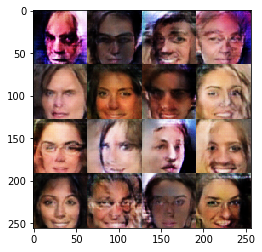

Epoch 1/1 - Batch 4910/6331:  Discriminator loss = 0.7686  Generator loss = 1.4620
Epoch 1/1 - Batch 4920/6331:  Discriminator loss = 0.8150  Generator loss = 1.1796
Epoch 1/1 - Batch 4930/6331:  Discriminator loss = 1.1876  Generator loss = 0.6618
Epoch 1/1 - Batch 4940/6331:  Discriminator loss = 0.8822  Generator loss = 1.1739
Epoch 1/1 - Batch 4950/6331:  Discriminator loss = 1.0052  Generator loss = 1.0236
Epoch 1/1 - Batch 4960/6331:  Discriminator loss = 1.2042  Generator loss = 0.6956
Epoch 1/1 - Batch 4970/6331:  Discriminator loss = 1.0944  Generator loss = 0.7549
Epoch 1/1 - Batch 4980/6331:  Discriminator loss = 0.7839  Generator loss = 1.4590
Epoch 1/1 - Batch 4990/6331:  Discriminator loss = 1.0766  Generator loss = 0.9323
Epoch 1/1 - Batch 5000/6331:  Discriminator loss = 1.4829  Generator loss = 0.4391


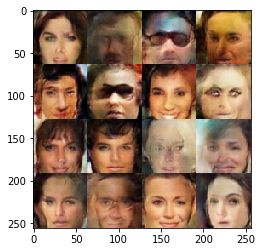

Epoch 1/1 - Batch 5010/6331:  Discriminator loss = 0.8879  Generator loss = 1.2587
Epoch 1/1 - Batch 5020/6331:  Discriminator loss = 0.7010  Generator loss = 1.5512
Epoch 1/1 - Batch 5030/6331:  Discriminator loss = 1.1698  Generator loss = 0.6943
Epoch 1/1 - Batch 5040/6331:  Discriminator loss = 0.7926  Generator loss = 1.4558
Epoch 1/1 - Batch 5050/6331:  Discriminator loss = 1.2056  Generator loss = 0.6311
Epoch 1/1 - Batch 5060/6331:  Discriminator loss = 1.6454  Generator loss = 0.3897
Epoch 1/1 - Batch 5070/6331:  Discriminator loss = 1.0867  Generator loss = 0.8378
Epoch 1/1 - Batch 5080/6331:  Discriminator loss = 1.3307  Generator loss = 2.5545
Epoch 1/1 - Batch 5090/6331:  Discriminator loss = 1.0468  Generator loss = 0.9715
Epoch 1/1 - Batch 5100/6331:  Discriminator loss = 0.7735  Generator loss = 1.4898


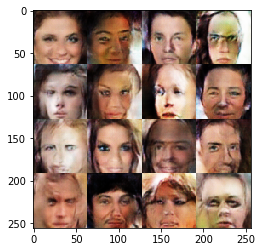

Epoch 1/1 - Batch 5110/6331:  Discriminator loss = 1.0406  Generator loss = 0.9392
Epoch 1/1 - Batch 5120/6331:  Discriminator loss = 1.1982  Generator loss = 0.6316
Epoch 1/1 - Batch 5130/6331:  Discriminator loss = 0.8671  Generator loss = 1.2612
Epoch 1/1 - Batch 5140/6331:  Discriminator loss = 0.7851  Generator loss = 1.4879
Epoch 1/1 - Batch 5150/6331:  Discriminator loss = 0.8753  Generator loss = 1.0626
Epoch 1/1 - Batch 5160/6331:  Discriminator loss = 0.8690  Generator loss = 1.1685
Epoch 1/1 - Batch 5170/6331:  Discriminator loss = 0.8937  Generator loss = 2.0810
Epoch 1/1 - Batch 5180/6331:  Discriminator loss = 1.0297  Generator loss = 1.8676
Epoch 1/1 - Batch 5190/6331:  Discriminator loss = 0.9651  Generator loss = 2.4440
Epoch 1/1 - Batch 5200/6331:  Discriminator loss = 1.1579  Generator loss = 0.7683


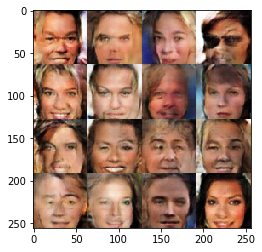

Epoch 1/1 - Batch 5210/6331:  Discriminator loss = 0.6038  Generator loss = 1.9286
Epoch 1/1 - Batch 5220/6331:  Discriminator loss = 0.9371  Generator loss = 1.0207
Epoch 1/1 - Batch 5230/6331:  Discriminator loss = 1.0069  Generator loss = 0.9384
Epoch 1/1 - Batch 5240/6331:  Discriminator loss = 1.0531  Generator loss = 0.8890
Epoch 1/1 - Batch 5250/6331:  Discriminator loss = 0.5804  Generator loss = 2.0000
Epoch 1/1 - Batch 5260/6331:  Discriminator loss = 0.7221  Generator loss = 1.7481
Epoch 1/1 - Batch 5270/6331:  Discriminator loss = 0.9813  Generator loss = 1.6672
Epoch 1/1 - Batch 5280/6331:  Discriminator loss = 1.4960  Generator loss = 0.4639
Epoch 1/1 - Batch 5290/6331:  Discriminator loss = 0.8608  Generator loss = 1.1419
Epoch 1/1 - Batch 5300/6331:  Discriminator loss = 0.7660  Generator loss = 1.4601


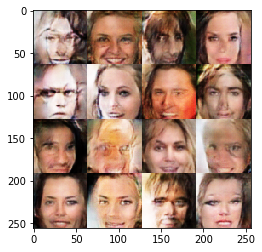

Epoch 1/1 - Batch 5310/6331:  Discriminator loss = 0.5508  Generator loss = 2.4018
Epoch 1/1 - Batch 5320/6331:  Discriminator loss = 1.0588  Generator loss = 1.1631
Epoch 1/1 - Batch 5330/6331:  Discriminator loss = 1.1024  Generator loss = 2.5951
Epoch 1/1 - Batch 5340/6331:  Discriminator loss = 1.2341  Generator loss = 1.8208
Epoch 1/1 - Batch 5350/6331:  Discriminator loss = 1.4350  Generator loss = 0.4813
Epoch 1/1 - Batch 5360/6331:  Discriminator loss = 1.0341  Generator loss = 0.9443
Epoch 1/1 - Batch 5370/6331:  Discriminator loss = 0.8186  Generator loss = 1.5449
Epoch 1/1 - Batch 5380/6331:  Discriminator loss = 1.8989  Generator loss = 0.2799
Epoch 1/1 - Batch 5390/6331:  Discriminator loss = 0.9294  Generator loss = 1.0373
Epoch 1/1 - Batch 5400/6331:  Discriminator loss = 1.0004  Generator loss = 0.9156


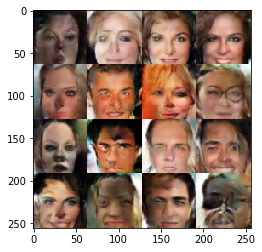

Epoch 1/1 - Batch 5410/6331:  Discriminator loss = 0.9741  Generator loss = 1.5119
Epoch 1/1 - Batch 5420/6331:  Discriminator loss = 0.7293  Generator loss = 1.4460
Epoch 1/1 - Batch 5430/6331:  Discriminator loss = 0.7820  Generator loss = 1.2862
Epoch 1/1 - Batch 5440/6331:  Discriminator loss = 0.7338  Generator loss = 1.6917
Epoch 1/1 - Batch 5450/6331:  Discriminator loss = 1.0087  Generator loss = 0.8872
Epoch 1/1 - Batch 5460/6331:  Discriminator loss = 0.7921  Generator loss = 2.2132
Epoch 1/1 - Batch 5470/6331:  Discriminator loss = 1.0697  Generator loss = 0.8528
Epoch 1/1 - Batch 5480/6331:  Discriminator loss = 0.8397  Generator loss = 1.1495
Epoch 1/1 - Batch 5490/6331:  Discriminator loss = 0.8754  Generator loss = 1.2025
Epoch 1/1 - Batch 5500/6331:  Discriminator loss = 1.4648  Generator loss = 0.4493


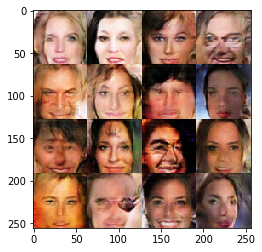

Epoch 1/1 - Batch 5510/6331:  Discriminator loss = 0.9395  Generator loss = 0.9414
Epoch 1/1 - Batch 5520/6331:  Discriminator loss = 0.6912  Generator loss = 1.5256
Epoch 1/1 - Batch 5530/6331:  Discriminator loss = 0.7659  Generator loss = 1.9237
Epoch 1/1 - Batch 5540/6331:  Discriminator loss = 0.8857  Generator loss = 1.0599
Epoch 1/1 - Batch 5550/6331:  Discriminator loss = 0.8476  Generator loss = 1.1342
Epoch 1/1 - Batch 5560/6331:  Discriminator loss = 0.7360  Generator loss = 1.6242
Epoch 1/1 - Batch 5570/6331:  Discriminator loss = 0.9643  Generator loss = 1.1190
Epoch 1/1 - Batch 5580/6331:  Discriminator loss = 1.1048  Generator loss = 0.7919
Epoch 1/1 - Batch 5590/6331:  Discriminator loss = 0.6950  Generator loss = 1.7572
Epoch 1/1 - Batch 5600/6331:  Discriminator loss = 1.2475  Generator loss = 0.6127


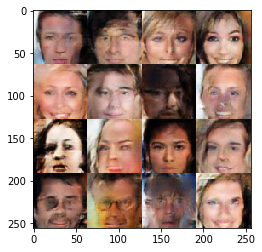

Epoch 1/1 - Batch 5610/6331:  Discriminator loss = 0.8990  Generator loss = 1.0908
Epoch 1/1 - Batch 5620/6331:  Discriminator loss = 0.9194  Generator loss = 0.9056
Epoch 1/1 - Batch 5630/6331:  Discriminator loss = 0.8098  Generator loss = 1.3136
Epoch 1/1 - Batch 5640/6331:  Discriminator loss = 1.2876  Generator loss = 0.6620
Epoch 1/1 - Batch 5650/6331:  Discriminator loss = 0.9285  Generator loss = 1.2249
Epoch 1/1 - Batch 5660/6331:  Discriminator loss = 0.7778  Generator loss = 2.1985
Epoch 1/1 - Batch 5670/6331:  Discriminator loss = 0.7412  Generator loss = 1.7059
Epoch 1/1 - Batch 5680/6331:  Discriminator loss = 0.7797  Generator loss = 1.2053
Epoch 1/1 - Batch 5690/6331:  Discriminator loss = 0.7487  Generator loss = 1.5368
Epoch 1/1 - Batch 5700/6331:  Discriminator loss = 0.9171  Generator loss = 0.9986


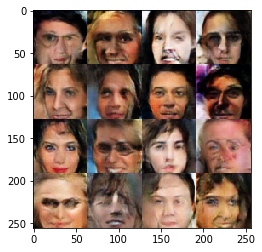

Epoch 1/1 - Batch 5710/6331:  Discriminator loss = 0.8195  Generator loss = 1.1703
Epoch 1/1 - Batch 5720/6331:  Discriminator loss = 0.6792  Generator loss = 1.6098
Epoch 1/1 - Batch 5730/6331:  Discriminator loss = 0.6865  Generator loss = 1.3892
Epoch 1/1 - Batch 5740/6331:  Discriminator loss = 0.6623  Generator loss = 1.8526
Epoch 1/1 - Batch 5750/6331:  Discriminator loss = 0.7618  Generator loss = 1.6583
Epoch 1/1 - Batch 5760/6331:  Discriminator loss = 0.7752  Generator loss = 1.3867
Epoch 1/1 - Batch 5770/6331:  Discriminator loss = 1.4238  Generator loss = 0.4733
Epoch 1/1 - Batch 5780/6331:  Discriminator loss = 0.6693  Generator loss = 1.5256
Epoch 1/1 - Batch 5790/6331:  Discriminator loss = 0.8556  Generator loss = 1.0855
Epoch 1/1 - Batch 5800/6331:  Discriminator loss = 0.8542  Generator loss = 1.0413


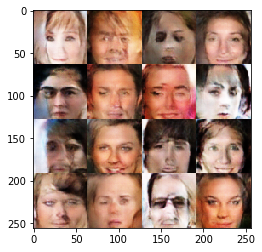

Epoch 1/1 - Batch 5810/6331:  Discriminator loss = 1.7372  Generator loss = 0.3526
Epoch 1/1 - Batch 5820/6331:  Discriminator loss = 1.8199  Generator loss = 0.3413
Epoch 1/1 - Batch 5830/6331:  Discriminator loss = 1.0754  Generator loss = 0.7908
Epoch 1/1 - Batch 5840/6331:  Discriminator loss = 1.0785  Generator loss = 0.7357
Epoch 1/1 - Batch 5850/6331:  Discriminator loss = 0.8649  Generator loss = 1.1518
Epoch 1/1 - Batch 5860/6331:  Discriminator loss = 1.0858  Generator loss = 0.8258
Epoch 1/1 - Batch 5870/6331:  Discriminator loss = 0.9917  Generator loss = 0.8843
Epoch 1/1 - Batch 5880/6331:  Discriminator loss = 0.6000  Generator loss = 1.9099
Epoch 1/1 - Batch 5890/6331:  Discriminator loss = 0.7949  Generator loss = 1.1730
Epoch 1/1 - Batch 5900/6331:  Discriminator loss = 1.0307  Generator loss = 0.8255


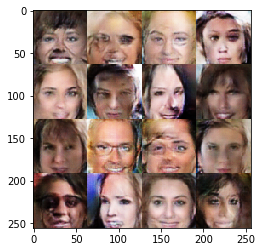

Epoch 1/1 - Batch 5910/6331:  Discriminator loss = 0.7580  Generator loss = 1.7518
Epoch 1/1 - Batch 5920/6331:  Discriminator loss = 1.1964  Generator loss = 2.8659
Epoch 1/1 - Batch 5930/6331:  Discriminator loss = 2.4555  Generator loss = 0.2027
Epoch 1/1 - Batch 5940/6331:  Discriminator loss = 1.2339  Generator loss = 0.6460
Epoch 1/1 - Batch 5950/6331:  Discriminator loss = 0.7807  Generator loss = 1.4458
Epoch 1/1 - Batch 5960/6331:  Discriminator loss = 0.7162  Generator loss = 1.7735
Epoch 1/1 - Batch 5970/6331:  Discriminator loss = 1.0567  Generator loss = 0.8901
Epoch 1/1 - Batch 5980/6331:  Discriminator loss = 0.8499  Generator loss = 1.1704
Epoch 1/1 - Batch 5990/6331:  Discriminator loss = 0.7829  Generator loss = 1.2732
Epoch 1/1 - Batch 6000/6331:  Discriminator loss = 0.9539  Generator loss = 0.9174


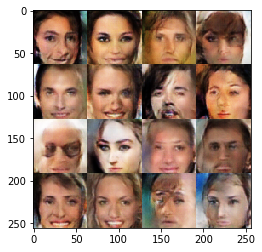

Epoch 1/1 - Batch 6010/6331:  Discriminator loss = 0.8048  Generator loss = 1.1976
Epoch 1/1 - Batch 6020/6331:  Discriminator loss = 1.0541  Generator loss = 0.7855
Epoch 1/1 - Batch 6030/6331:  Discriminator loss = 1.2098  Generator loss = 0.6132
Epoch 1/1 - Batch 6040/6331:  Discriminator loss = 0.9757  Generator loss = 0.8840
Epoch 1/1 - Batch 6050/6331:  Discriminator loss = 0.7739  Generator loss = 1.7739
Epoch 1/1 - Batch 6060/6331:  Discriminator loss = 1.1415  Generator loss = 0.6895
Epoch 1/1 - Batch 6070/6331:  Discriminator loss = 0.8533  Generator loss = 1.0863
Epoch 1/1 - Batch 6080/6331:  Discriminator loss = 0.9731  Generator loss = 1.0151
Epoch 1/1 - Batch 6090/6331:  Discriminator loss = 0.9906  Generator loss = 0.8587
Epoch 1/1 - Batch 6100/6331:  Discriminator loss = 1.0370  Generator loss = 0.8215


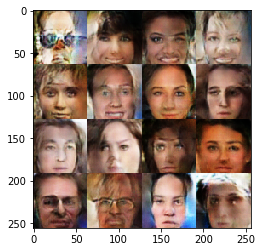

Epoch 1/1 - Batch 6110/6331:  Discriminator loss = 0.7328  Generator loss = 1.6047
Epoch 1/1 - Batch 6120/6331:  Discriminator loss = 1.0825  Generator loss = 0.8455
Epoch 1/1 - Batch 6130/6331:  Discriminator loss = 1.3687  Generator loss = 0.5066
Epoch 1/1 - Batch 6140/6331:  Discriminator loss = 1.1222  Generator loss = 0.7880
Epoch 1/1 - Batch 6150/6331:  Discriminator loss = 0.7863  Generator loss = 1.3176
Epoch 1/1 - Batch 6160/6331:  Discriminator loss = 0.7899  Generator loss = 1.1550
Epoch 1/1 - Batch 6170/6331:  Discriminator loss = 0.8620  Generator loss = 2.5307
Epoch 1/1 - Batch 6180/6331:  Discriminator loss = 0.7888  Generator loss = 2.2808
Epoch 1/1 - Batch 6190/6331:  Discriminator loss = 0.6683  Generator loss = 2.2494
Epoch 1/1 - Batch 6200/6331:  Discriminator loss = 1.0411  Generator loss = 0.9050


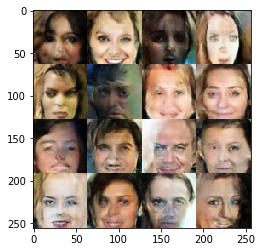

Epoch 1/1 - Batch 6210/6331:  Discriminator loss = 0.8076  Generator loss = 1.2554
Epoch 1/1 - Batch 6220/6331:  Discriminator loss = 0.7405  Generator loss = 1.8822
Epoch 1/1 - Batch 6230/6331:  Discriminator loss = 1.1807  Generator loss = 0.6485
Epoch 1/1 - Batch 6240/6331:  Discriminator loss = 1.5112  Generator loss = 0.5073
Epoch 1/1 - Batch 6250/6331:  Discriminator loss = 0.9417  Generator loss = 0.9559
Epoch 1/1 - Batch 6260/6331:  Discriminator loss = 1.3641  Generator loss = 0.5588
Epoch 1/1 - Batch 6270/6331:  Discriminator loss = 0.7404  Generator loss = 1.4136
Epoch 1/1 - Batch 6280/6331:  Discriminator loss = 0.8591  Generator loss = 1.1135
Epoch 1/1 - Batch 6290/6331:  Discriminator loss = 1.2394  Generator loss = 0.5884
Epoch 1/1 - Batch 6300/6331:  Discriminator loss = 0.5809  Generator loss = 2.0206


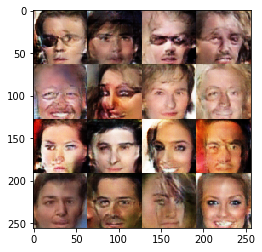

Epoch 1/1 - Batch 6310/6331:  Discriminator loss = 1.0203  Generator loss = 0.8468
Epoch 1/1 - Batch 6320/6331:  Discriminator loss = 0.6147  Generator loss = 2.0182
Epoch 1/1 - Batch 6330/6331:  Discriminator loss = 0.9388  Generator loss = 1.7980


In [10]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5
n_images = 16

epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches, celeba_dataset.shape, celeba_dataset.image_mode)